<a href="https://colab.research.google.com/github/orekhovsky/GenAI-mini-projects/blob/main/Style_transfering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Neural Style Transfer

### Описание алгоритма NST

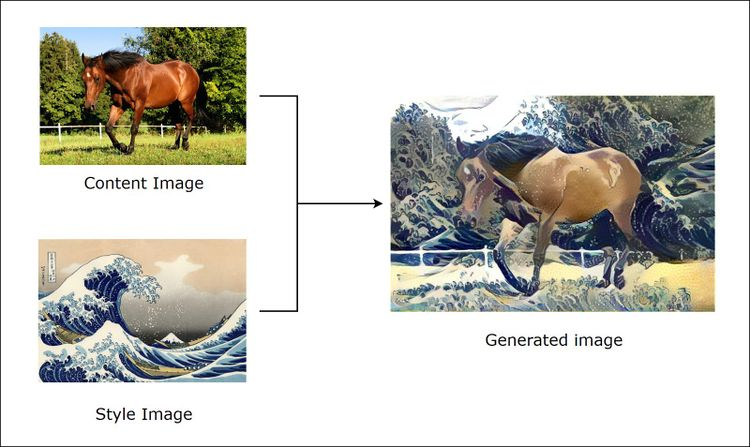

Алгоритм нейронного переноса стиля (Neural Style Transfer, NST), разработанный Леоном Гатисом, Александром Экером и Матиасом Бетге, преобразует полученное на вход изображение в соответствии с выбранным стилем. Алгоритм берет два изображения:

* Изображение контента (англ. Content Image), в котором нас интересует содержание. Обычно оно является фотографией.

* Изображение стиля (англ. Style Image), в котором нас интересует художественный стиль (цветовое наполнение, текстуры и т.д.). Обычно изображением стиля являются картины известных художников.

Затем алгоритм изменяет входные данные так, чтобы они соответствовали содержанию изображения контента и художественному стилю изображения стиля. Авторами в качестве модели сверточной нейронной сети предлагается использовать сеть VGG16.

### История алгоритма NST

### Обзор предыдущих методов

До появления NST исследования расширились вокруг области, называемой **нефотореалистичным рендерингом** (non-photorealistic rendering, NPR). В настоящее время это твердо установленная область в сообществе компьютерной графики. Однако большинство алгоритмов NPR стилизации обычно сильно зависят от конкретных художественных стилей (например, масляные картины, анимация), которые они имитируют. Эти алгоритмы не могут быть легко расширены для получения стилизованных результатов для других художественных стилей.

В отличие от NST, алгоритмы NPR не используют нейронные сети. Рассмотрим некоторые NPR-алгоритмы без CNN, a именно NPR-алгоритмы художественного рендеринга 2D-изображений, который называется **художественным рендерингом на основе изображений** (image-based artistic rendering, IB-AR):

**Stroke-Based Rendering**

*Рендеринг на основе штрихов (SBR)* относится к процессу размещения виртуальных штрихов (например, мазков кистью, фрагментов, штрихов) на цифровом холсте для визуализации фотографии с определенным стилем. Процесс SBR, как правило, начинается с исходной фотографии, поэтапно комбинируя мазки в соответствии с фотографией и, создает нефотореалистичные изображения, которые выглядят как фотография, но с художественным стилем (рисунок ниже).

SBR обычно эффективен при моделировании определенных типов стилей (например, масляной живописи, акварели, эскизов). Однако каждый алгоритм SBR тщательно спроектирован только для одного конкретного стиля и не способен моделировать произвольный стиль.

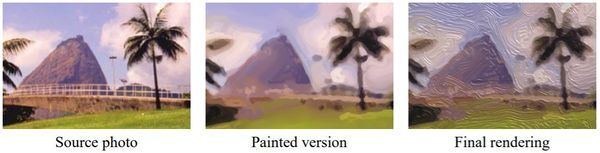

**Region-Based Techniques**

*Рендеринг на основе регионов (RBT)** включает сегментацию регионов, чтобы обеспечить адаптацию рендеринга на основе контента в регионах. Алгоритмы RBT используют форму регионов для определения расположения штрихов. Таким образом, различные образцы штрихов могут быть созданы в разных семантических областях изображения (рисунок ниже).

Учет регионов при рендеринге позволяет осуществлять локальный контроль над уровнем детализации. Однако проблема SBR сохраняется: RBT не способен имитировать произвольный стиль.

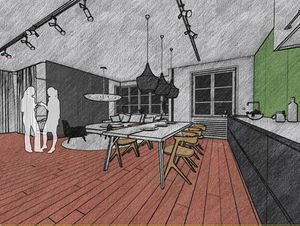

**Example-Based Rendering**

*Рендеринга на основе примеров (EBR)* изучает соответствия между образцовой парой, то есть соответствия между исходными и целевыми стилизованными изображениями под наблюдением. Обучающий набор содержит пары не стилизованных исходных изображений и соответствующие стилизованные изображения с определенным стилем. Затем алгоритм аналогии изображений изучает аналогичное преобразование из обучающих пар и создает аналогичные стилизованные результаты при получении тестовой входной фотографии.

В целом, аналогия с изображениями эффективна для различных художественных стилей. Однако пары тренировочных данных обычно недоступны. К тому же аналогия изображений использует низкоуровневые функции, которые не позволяют эффективно захватывать контент и стиль, что ограничивает производительность.

### Происхождение NST

Несмотря на то, что некоторые алгоритмы IB-AR без CNN способны точно отображать определенные стили, они обычно имеют ограничения в гибкости, разнообразии стилей и эффективном извлечении структуры изображения. Следовательно, существует потребность в новых алгоритмах для устранения этих ограничений, что порождает **область NST**.

Леон Гатис первый, кто изучил, как использовать CNN для воспроизведения известных стилей рисования на естественных изображениях. Он предложили смоделировать контент фотографии в качестве ответа функции от предварительно обученного CNN, а затем смоделировать стиль художественного произведения в качестве сводной статистики функции. Его эксперименты показали, что CNN способен извлекать информацию о содержании из произвольной фотографии и информацию о стиле из произведения искусства. На основании этого открытия Гатис впервые предложил использовать активацию функции CNN для рекомбинации контента данной фотографии и стиля известных произведений искусства. Основная идея его алгоритма состоит в том, чтобы итеративно оптимизировать изображение с целью сопоставления желаемых распределений функций CNN, которые включают в себя информацию о содержании фотографии и информацию о стиле произведения искусства.

### Принцип работы алгоритма NST

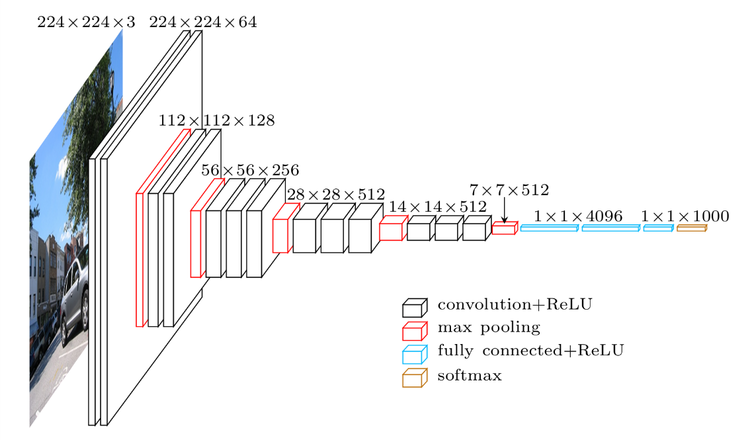

Рассмотрим 1-й сверточный слой (англ. convolution layer) VGG16, который использует ядро 3x3 и обучает 64 карты признаков (англ. feature map) для генерации представления изображения размерности 224x224x64, принимая 3-канальное изображение размером 224x224 в качестве входных данных (Рисунок ниже).

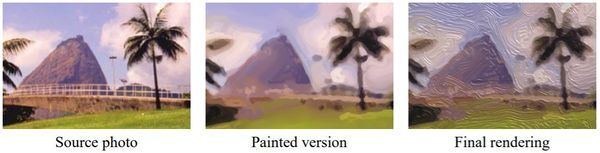

Во время обучения эти карты признаков научились обнаруживать простые шаблоны, например, такие как прямые линии, окружности или даже не имеющие никакого смысла для человеческого глаза шаблоны, которые тем не менее имеют огромное значение для этой модели. Такое "обнаружение" шаблонов называется обучением представления признаков. Теперь давайте рассмотрим 10-й сверточный слой VGG16, который использует ядро 3x3 с 512 картами признаков для обучения и в итоге генерирует вывод представления изображения размерности 28x28x512. Нейроны 10-го слоя уже могут обнаруживать более сложные шаблоны такие как, например, колесо автомобиля, окно или дерево и т.д.

Собственно вышеперечисленные свойства характерны для любой сверточной нейронной сети, работа которой обычно интерпретируется как переход от конкретных особенностей изображения к более абстрактным деталям вплоть до выделения понятий высокого уровня. При этом сеть самонастраивается и вырабатывает необходимую иерархию абстрактных признаков (последовательности карт признаков), фильтруя маловажные детали и выделяя существенное.

> Такая природа представления кодирования сама по себе является ключом к передаче стиля, который используется для вычисления функции потерь между сгенерированным изображением относительно изображения контента и изображения стиля. При обучении модели более десяти тысяч изображений на класс модель может генерировать аналогичное представление признаков для множества различных изображений, если они принадлежат к одному классу или имеют схожий контент или стиль.

Следовательно, имеет смысл использовать разницу в значении представления признаков сгенерированного изображения по содержанию и по стилю изображения, чтобы направлять итерации, через которые мы производим само сгенерированное изображение, но как убедиться, что изображение с контентом **C** и сгенерированное изображение **G** похожи по своему содержанию, а не по стилю, в то время как сгенерированное изображение наследует только похожее представление стиля изображения стиля **S**, а не само изображение стиля в целом. Это решается разделением функции потерь на две части: одна — потеря контента, а другая — потеря стиля.

### Производные NST

Чтобы автоматически передать художественный стиль, первая и самая важная проблема заключается в том, как смоделировать и извлечь стиль из изображения. Так как стиль очень связан с текстурой, простой способ - связать **визуальное моделирование стилей** (англ. Visual Style Modelling) с ранее хорошо изученными методами **визуального моделирования текстур** (англ. Visual Texture Modelling). После получения представления стиля следующая проблема состоит в том, как восстановить изображение с информацией о желаемом стиле, сохранив его содержимое, что решается с помощью **методов восстановления изображения** (англ. Image Reconstruction techniques).

#### **Visual Texture Modelling**

**Parametric Texture Modelling with Summary Statistics**

Одним из путей к моделированию текстуры является сбор статистики изображения из образца текстуры и использование сводных статистических свойств для моделирования текстуры. Создается представление на основе Грама для текстур модели, которое представляет собой корреляцию между откликами фильтра в различных слоях предварительно обученной классификационной сети (сеть VGG). Представление на основе Грама кодирует статистику второго порядка набора ответов фильтра CNN.

**Non-parametric Texture Modelling with Markov Random Fields (MRFs)**

Другой известной методологией моделирования текстур является использование непараметрического ресемплирования. Различные непараметрические методы основаны на **модели MRF**, которая предполагает, что в текстурном изображении каждый пиксель полностью характеризуется своей пространственной окрестностью. Предлагается синтезировать каждый пиксель один за другим путем поиска похожих окрестностей в исходном текстурном изображении и назначения соответствующего пикселя. Ускорить процесс сопоставления окрестностей можно используя фиксированную окрестность.

#### **Image Reconstruction techniques**

**Реконструкция изображения** - это обратный процесс, который заключается в восстановлении всего входного изображения из извлеченного представления изображения. Алгоритмы реконструкции изображения на основе представления CNN:

**Image-Optimisation-Based Online Image Reconstruction**

*Реконструкция изображений на основе оптимизации изображений* (IOB-IR). Учитывая обратное представление CNN, алгоритм итеративно оптимизирует изображение (обычно начиная со случайного шума), пока не получит аналогичное желаемое представление CNN. Итеративный процесс оптимизации основан на градиентном спуске в пространстве изображения. Следовательно, процесс занимает много времени, особенно когда желаемое восстановленное изображение является большим.

**Model-Optimisation-Based Offline Image Reconstruction**

*Реконструкция автономных изображений на основе оптимизации моделей* (MOB-IR). Для решения проблемы эффективности, было предложено заранее обучить сеть прямой связи (англ. feed-forward network) и поставить вычислительную нагрузку на этапе обучения. На этапе тестирования обратный процесс может быть просто выполнен с помощью прямого прохода по сети. Это значительно ускоряет процесс восстановления изображения.

### Классификация методов NST

Текущие методы NST относятся к одной из двух категорий:

* **Image-Optimisation-Based Online Neural Methods** (IOB-NST). Эта категория передает стиль путем прямого обновления пикселей в изображении итеративно, основана на методах IOB-IR.

* **Model-Optimisation-Based Offline Neural Methods** (MOB-NST). Эта категория итеративно оптимизирует генеративную модель и создает стилизованное изображение через один прямой проход, основана на методах MOB-IR.

#### **Image-Optimisation-Based Online Neural Methods**

Основная идея алгоритмов IOB-NST состоит в том, чтобы сначала смоделировать и извлечь информацию о стиле и контенте из соответствующих изображений стиля и контента, объединить их в качестве целевого представления, а затем итеративно восстановить стилизованный результат, который соответствует целевому представлению.

Разные алгоритмы IOB-NST используют одну и ту же технику IOB-IR, но отличаются тем, как они моделируют визуальный стиль, который основан на категориях методов визуального моделирования текстур.

Общим ограничением алгоритмов IOB-NST является то, что они являются дорогостоящими в вычислительном отношении, из-за итеративной процедуры оптимизации изображения.

**Преимущества:**

* Высокая гибкость в адаптации к любому стилю и контенту.

* Позволяет достичь детализированных и аккуратных результатов.

**Недостатки:**

* Очень ресурсоемкий и медленный, поскольку стилизация каждого изображения начинается с нуля.

* Многочисленные итерации увеличивают вычислительные затраты.

#### **Model-Optimisation-Based Offline Neural Methods**

Основная идея MOB-NST заключается в том, чтобы сначала обучить генеративную модель воспроизводить заданный стиль, оптимизируя её параметры. После завершения этого этапа обученная модель может быстро и эффективно стилизовать новые изображения за один прямой проход.

MOB-NST фокусируется на том, чтобы адаптировать параметры модели (например, веса нейронной сети), чтобы она могла точно воспроизводить стиль. Это требует начальной итеративной оптимизации, но после этого процесс стилизации становится быстрым.

**Преимущества:**

* Высокая скорость стилизации после завершения оптимизации модели.

* Хорошо подходит для случаев, где однотипные стили применяются к множеству изображений.

**Недостатки:**

* Более сложный процесс начальной оптимизации модели.

* Меньше гибкости при изменении стиля: при смене стиля требуется переоптимизировать модель, что может быть трудоемким.

##### Вопросы:
1. Что такое NST?
2. Какой принцип работы?

### Расширения алгоритмов NST

Вышеупомянутые методы NST предназначены для общих неподвижных изображений. Они могут не подходить для специализированных типов изображений и видео (например, рисунков, портретов на голове и видеокадров), поэтому были созданы расширения алгоритма NST на эти конкретные типы.

#### **Semantic Style Transfer**

При наличии пары стиля и изображений контента, которые похожи по содержанию, цель передачи семантического стиля состоит в создании семантического соответствия между стилем и контентом, который отображает каждую область стиля в соответствующую семантически подобную область контента.

#### **Instance Style Transfer**

Передача стиля экземпляра основана на сегментации экземпляра и предназначена для стилизации только одного указанного пользователем объекта в изображении. Основная проблема заключается в переходе между стилизованным объектом и нестилизованным фоном. Эту проблему можно решить путем добавления дополнительных потерь на основе MRF к сглаживающим граничным пикселям.

#### **Doodle Style Transfer**

Передача стиля каракулей заключается в использовании NST для преобразования черновых набросков в произведения искусства. Метод просто отбрасывает термин потери содержимого и использует рисунки в качестве карты сегментации для передачи семантического стиля.

####**Portrait Style Transfer**

Современные алгоритмы передачи стилей обычно не оптимизированы для головных портретов. Поскольку они не накладывают пространственных ограничений, непосредственное применение этих существующих алгоритмов к портретам головы приведет к деформации структур лица. Решить эту проблему можно использованием карт усиления для ограничения пространственных конфигураций, которые могут сохранить структуры лица при передаче текстуры стиля изображения.

#### **Video Style Transfer**

В отличие от передачи стиля неподвижного изображения, при разработке алгоритма передачи стиля видео необходимо учитывать плавный переход между соседними видеокадрами.

**Image-Optimisation-Based Online Video Style Transfer**

Передача онлайн-стилей видео на основе оптимизации изображений: вводится временная потерю согласованности, основанная на оптическом потоке, чтобы штрафовать отклонения вдоль точечных траекторий. Оптический поток рассчитывается с использованием новых алгоритмов оценки оптического потока. В результате алгоритм устраняет временные артефакты и создает плавные стилизованные видеоролики. Однако при таком способе требуется несколько минут для обработки одного кадра.

**Model-Optimisation-Based Offline Video Style Transfer**

Оффлайн-стиль передачи видео на основе оптимизации моделей: для стилизации видео в режиме реального времени Хуан предлагает увеличить временную потерю согласованности при использовании текущего алгоритма PSPM. Для двух последовательных кадров потеря временной согласованности напрямую рассчитывается с использованием двух соответствующих выходных данных NST для поощрения согласованности по пикселям. Для вычисления потери временной согласованности вводится соответствующая двухкадровая стратегия синергетического обучения.

#### **Character Style Transfer**

Целью передачи стиля символа является применение идеи NST для создания новых шрифтов и текстовых эффектов. Янг предложил охарактеризовать элементы стиля и использовать извлеченные характеристики, чтобы направлять генерацию текстовых эффектов.

#### **Photorealistic Style Transfer**

Фотореалистичная передача стиля (также известная как передача стиля цвета) направлена ​​на передачу стиля распределения цвета. Общая идея состоит в том, чтобы основываться на текущей передаче семантического стиля, но исключить искажения и сохранить первоначальную структуру изображения контента.

**Image-Optimisation-Based Photorealistic Style Transfer**

Передача фотореалистичного стиля на основе оптимизации изображений. **Алгоритм Луана** предлагает двухэтапную процедуру оптимизации, которая состоит в том, чтобы инициализировать оптимизацию путем стилизации данной фотографии с помощью [[Neural_Style_Trasfer#Semantic Style Transfer | Image-Optimisation-Based Semantic Style Transfer], а затем штрафовать искажения изображения, добавляя регуляризацию фотореализма. Но поскольку алгоритм Луана основан на методе передачи семантического стиля на основе оптимизации изображений, он требует больших вычислительных затрат.

**Алгоритм Мехреза** также использует двухэтапную процедуру оптимизации. Он предлагает уточнить нефотореалистичный стилизованный результат путем сопоставления градиентов на выходном изображении с градиентами на фотографии содержимого. Этот алгоритм достигает более быстрой скорости фотореалистичной стилизации.

**Model-Optimisation-Based Photorealistic Style Transfer**

Передача фотореалистичного стиля на основе оптимизации моделей: Ли решил проблему эффективности, обрабатывая эту проблему в два этапа: этап стилизации и этап сглаживания. Шаг стилизации состоит в том, чтобы заменить слои с повышенной дискретизацией на неиспользуемые слои, чтобы получить стилизованный результат с меньшим количеством искажений. Затем этап сглаживания дополнительно устраняет структурные артефакты.

#### **Audio Style Transfer**

Аудио Стиль передачи. В дополнение к передаче стилей изображения, [90], [91] расширяют область стиля изображения до стиля звука и синтезируют новые звуки, передавая нужный стиль из целевого аудио. Исследование передачи стиля звука также следует пути передачи стиля изображения, то есть передачи аудио стиля онлайн на основе оптимизации звука (Audio-Optimisation-Based Online Audio Style Transfer), а затем передачи стиля аудио в автономном режиме на основе оптимизации модели (Model-Optimisation-Based Offline Audio Style Transfer). На основании алгоритма IOB-NST, был создан **алгоритм Верма и Смита** передачи аудио стиля на основе аудиооптимизации, основанный на оптимизации аудио онлайн. Алгоритм начинает с шумового сигнала и итеративно оптимизируют его, используя обратное распространение.

### ПРАКТИКА

**Перенос нейронного стиля** — это метод оптимизации, который позволяет взять два изображения — изображение с содержимым и изображение с эталонным стилем (например, картину известного художника) — и объединить их так, чтобы итоговое изображение выглядело как исходное, но «написанное» в стиле эталонного изображения.

Это реализуется путем оптимизации итогового изображения так, чтобы его статистические данные соответствовали содержанию исходного изображения и стилю эталонного изображения. Эти статистики извлекаются из изображений с помощью сверточной нейронной сети.

Например, возьмем изображение собаки и картину Василия Кандинского "Композиция 7":

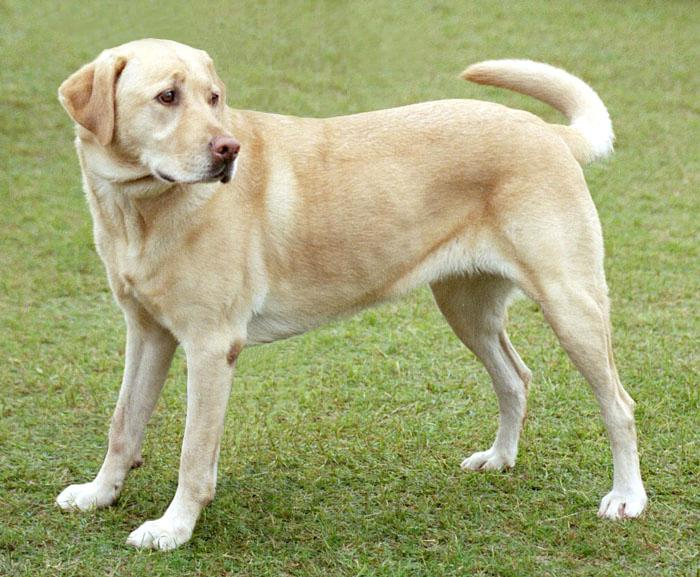

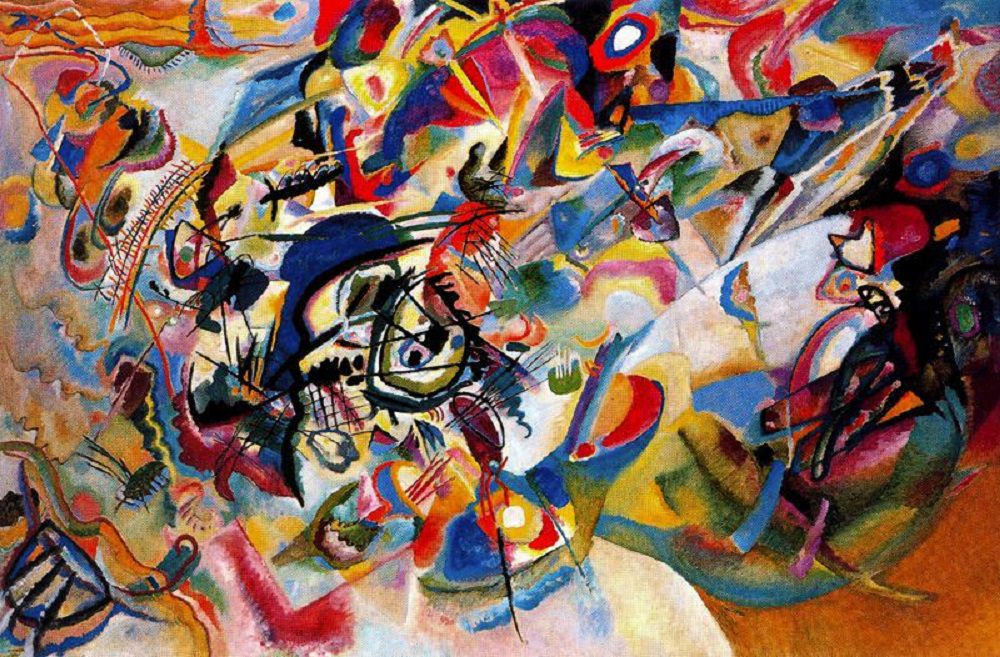

Если представить, что Кандинский решил бы нарисовать изображение этой собаки в своем уникальном стиле, оно могло бы выглядеть примерно так: формы и силуэт собаки были бы сохранены, но все детали были бы переработаны в абстрактной манере, характерной для "Композиции 7".

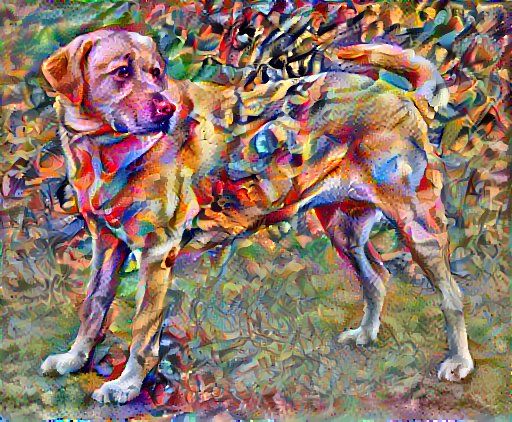

## Настройка


### Импорт и конфигурация модулей

In [ ]:
import os  # Импортируем модуль для работы с операционной системой
import tensorflow as tf  # Импортируем TensorFlow и присваиваем псевдоним tf для удобства

# Настройка для загрузки моделей из TensorFlow Hub в сжатом формате
# Это уменьшает объем памяти и место на диске, требуемые для моделей
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'


In [ ]:
import IPython.display as display  # Импортируем модуль для отображения изображений и других объектов в IPython (например, в Jupyter Notebook)

import matplotlib.pyplot as plt  # Импортируем модуль для визуализации данных и присваиваем псевдоним plt
import matplotlib as mpl  # Импортируем библиотеку matplotlib для настройки параметров визуализации
mpl.rcParams['figure.figsize'] = (12, 12)  # Устанавливаем размер графиков по умолчанию
mpl.rcParams['axes.grid'] = False  # Отключаем отображение сетки на графиках

import numpy as np  # Импортируем библиотеку для работы с массивами данных и присваиваем псевдоним np
import PIL.Image  # Импортируем модуль для работы с изображениями через библиотеку PIL (Python Imaging Library)
import time  # Импортируем модуль для измерения времени, полезен для профилирования кода
import functools  # Импортируем модуль для работы с функциями, например, для создания частично примененных функций


In [ ]:
def tensor_to_image(tensor):
    # Масштабируем значения тензора к диапазону от 0 до 255 для изображения
    tensor = tensor * 255

    # Преобразуем тензор в массив numpy типа uint8, чтобы он соответствовал формату изображений
    tensor = np.array(tensor, dtype=np.uint8)

    # Проверяем, что тензор многомерный, и если он имеет лишнее измерение, удаляем его
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1  # Убеждаемся, что первое измерение имеет размер 1
        tensor = tensor[0]  # Убираем это измерение для получения изображения в формате HxWxC

    # Преобразуем массив numpy в изображение PIL и возвращаем его
    return PIL.Image.fromarray(tensor)


Скачивание изображения и выбор изображение стиля и изображение содержимого:

In [ ]:
# Скачиваем изображение содержимого
content_path = tf.keras.utils.get_file(
    'YellowLabradorLooking_new.jpg',
    'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg'
)

# Скачиваем изображение стиля
style_path = tf.keras.utils.get_file(
    'kandinsky5.jpg',
    'https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_5.jpg'
)


## Визуализация входных данных

Определение функции для загрузки изображения и ограничения его максимального размера до 512 пикселей

In [ ]:
def load_img(path_to_img):
    max_dim = 512  # Максимальный размер изображения (в пикселях)

    # Чтение изображения из файла
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)  # Декодирование изображения с тремя каналами (RGB)
    img = tf.image.convert_image_dtype(img, tf.float32)  # Конвертация данных изображения в тип float32

    # Определение текущих размеров изображения
    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)  # Определяем длинное измерение (ширина или высота)
    scale = max_dim / long_dim  # Вычисляем коэффициент масштабирования

    # Вычисляем новые размеры с учетом ограничения по максимальному размеру
    new_shape = tf.cast(shape * scale, tf.int32)

    # Изменяем размер изображения
    img = tf.image.resize(img, new_shape)

    # Добавляем измерение батча (1, H, W, C) для совместимости с моделями
    img = img[tf.newaxis, :]
    return img


Создание простой функции для отображения изображения

In [ ]:
def imshow(image, title=None):
    # Удаляем измерение батча, если оно присутствует
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)  # Убираем первое измерение (батч)

    plt.imshow(image)  # Отображаем изображение с помощью matplotlib
    if title:
        plt.title(title)  # Если задан заголовок, устанавливаем его для графика
    plt.axis('off')  # Отключаем оси для более чистого отображения
    plt.show()  # Показываем изображение


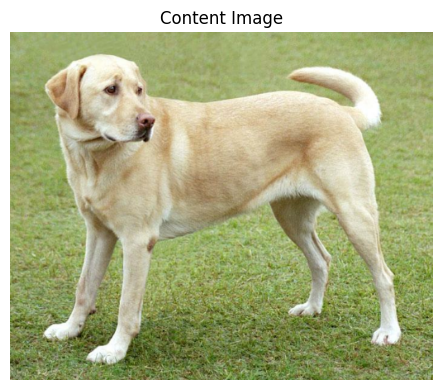

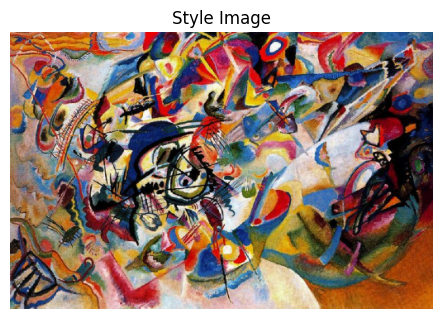

In [ ]:
# Загружаем изображение содержимого
content_image = load_img(content_path)

# Загружаем изображение стиля
style_image = load_img(style_path)

# Создаем подграфики для отображения изображений
plt.subplot(1, 2, 1)  # Первый подграфик (1 строка, 2 столбца, 1-я позиция)
imshow(content_image, 'Content Image')  # Отображаем изображение содержимого с заголовком

plt.subplot(1, 2, 2)  # Второй подграфик (1 строка, 2 столбца, 2-я позиция)
imshow(style_image, 'Style Image')  # Отображаем изображение стиля с заголовком

plt.show()  # Показываем все графики


## Быстрый перенос стиля с использованием TF-Hub

 Прежде чем углубиться в детали, давайте посмотрим, как модель TensorFlow Hub выполняет эту задачу:

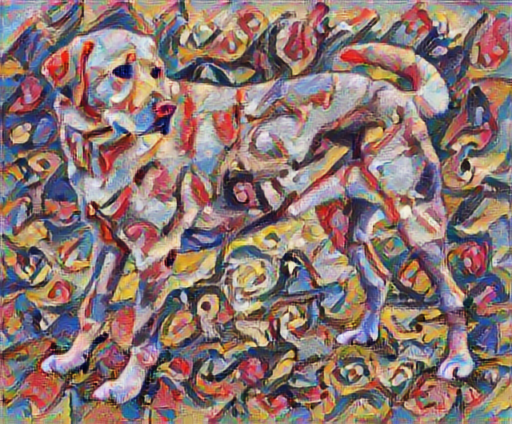

In [ ]:
import tensorflow_hub as hub  # Импортируем TensorFlow Hub для работы с предобученными моделями

# Загружаем модель для переноса стиля из TensorFlow Hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

# Применяем модель для переноса стиля, передавая изображение содержимого и изображение стиля
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]

# Преобразуем тензор с результирующим изображением в формат, подходящий для отображения
result_image = tensor_to_image(stylized_image)

# Отображаем результат
result_image


## Определите представления содержимого и стиля

Используйте промежуточные слои модели, чтобы получить представления содержимого и стиля изображения. Начиная с входного слоя сети, активации первых нескольких слоев представляют низкоуровневые признаки, такие как границы и текстуры. По мере продвижения через сеть последние несколько слоев представляют более высокоуровневые признаки — части объектов, такие как колеса или глаза. В данном случае вы используете архитектуру сети VGG19, предобученную для классификации изображений. Эти промежуточные слои необходимы для определения представлений содержимого и стиля изображений. Для входного изображения попытайтесь сопоставить соответствующие представления стиля и содержимого в этих промежуточных слоях.


Загрузите [VGG19](https://keras.io/api/applications/vgg/#vgg19-function) и протестируйте его на нашем изображении, чтобы убедиться, что он используется правильно

In [ ]:
# Предобрабатываем изображение для подачи в VGG19
x = tf.keras.applications.vgg19.preprocess_input(content_image * 255)  # Масштабируем пиксели в диапазон, подходящий для VGG
x = tf.image.resize(x, (224, 224))  # Изменяем размер изображения до 224x224 пикселей, ожидаемого VGG19

# Загружаем предобученную модель VGG19 с весами, обученными на ImageNet
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')

# Получаем вероятности предсказаний для изображения
prediction_probabilities = vgg(x)

# Выводим форму (размерность) выходного тензора
prediction_probabilities.shape  # Ожидается размер (1, 1000) для 1000 классов в ImageNet


TensorShape([1, 1000])

In [ ]:
# Декодируем вероятности предсказаний в имена классов и вероятности
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]

# Извлекаем имена классов и соответствующие вероятности в удобный формат
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]


[('Labrador_retriever', 0.49317148),
 ('golden_retriever', 0.23665288),
 ('kuvasz', 0.036357507),
 ('Chesapeake_Bay_retriever', 0.02418274),
 ('Greater_Swiss_Mountain_dog', 0.01864608)]

Теперь загрузите VGG19 без классификационного слоя и перечислите названия слоев

In [ ]:
# Загружаем VGG19 без классификационного слоя (head)
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

# Перечисляем названия всех слоев в модели VGG19
print("Layer names in VGG19:")
for layer in vgg.layers:
    print(layer.name)


Layer names in VGG19:
input_layer_9
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


Выберите промежуточные слои сети для представления стиля и содержимого изображения

In [ ]:
# Определяем промежуточные слои для представления содержимого
content_layers = ['block5_conv2']  # Слой, представляющий содержимое изображения

# Определяем промежуточные слои для представления стиля
style_layers = [
    'block1_conv1',  # Низкоуровневые признаки (текстуры)
    'block2_conv1',
    'block3_conv1',
    'block4_conv1',
    'block5_conv1'   # Высокоуровневые признаки (формы)
]

# Получаем количество слоев содержимого и стиля
num_content_layers = len(content_layers)  # Количество слоев для содержимого
num_style_layers = len(style_layers)  # Количество слоев для стиля


In [ ]:
print(num_content_layers, num_style_layers)

1 5


#### Промежуточные слои для стиля и содержимого

Почему эти промежуточные выходные данные в нашей предобученной сети для классификации изображений позволяют нам определить представления стиля и содержимого?

На высоком уровне, для того чтобы сеть могла выполнять классификацию изображений (для чего эта сеть была обучена), она должна понимать изображение. Это требует преобразования необработанных пикселей изображения в внутреннее представление, которое преобразует эти пиксели в сложное понимание признаков, присутствующих в изображении.

Это также объясняет, почему сверточные нейронные сети (CNN) хорошо обобщают: они способны захватывать инварианты и определяющие признаки внутри классов (например, кошки против собак), которые не зависят от фона и других помех. Таким образом, где-то между тем, где необработанное изображение подается в модель, и выходной меткой классификации, модель служит сложным экстрактором признаков. Получая доступ к промежуточным слоям модели, вы можете описать содержимое и стиль входных изображений.

## Создайте модель

Сети в `tf.keras.applications` разработаны так, чтобы вы могли легко извлекать значения промежуточных слоев, используя функциональный API Keras.

Чтобы определить модель с помощью функционального API, укажите входные и выходные данные:

model = Model(inputs, outputs)

Следующая функция строит модель VGG19, которая возвращает список выходных данных промежуточных слоев:

In [ ]:
def vgg_layers(layer_names):
    """Создает модель VGG, которая возвращает список значений промежуточных выходов."""
    # Загружаем модель. Загружаем предобученный VGG, обученный на данных ImageNet
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False  # Замораживаем веса модели, чтобы они не изменялись во время обучения

    # Получаем выходы указанных слоев
    outputs = [vgg.get_layer(name).output for name in layer_names]

    # Создаем модель, которая принимает входные данные VGG и возвращает выходы промежуточных слоев
    model = tf.keras.Model([vgg.input], outputs)
    return model


Чтобы создать модель:

In [ ]:
# Создаем экстрактор стиля, используя определенные слои
style_extractor = vgg_layers(style_layers)

# Получаем выходные значения для изображений стиля
style_outputs = style_extractor(style_image * 255)

# Изучаем статистику каждого выходного значения слоя
for name, output in zip(style_layers, style_outputs):
    print(name)  # Имя слоя
    print("  shape: ", output.numpy().shape)  # Форма выходного тензора
    print("  min: ", output.numpy().min())  # Минимальное значение
    print("  max: ", output.numpy().max())  # Максимальное значение
    print("  mean: ", output.numpy().mean())  # Среднее значение
    print()  # Печатаем пустую строку для разделения


block1_conv1
  shape:  (1, 336, 512, 64)
  min:  0.0
  max:  835.5256
  mean:  33.97525

block2_conv1
  shape:  (1, 168, 256, 128)
  min:  0.0
  max:  4625.8857
  mean:  199.82687

block3_conv1
  shape:  (1, 84, 128, 256)
  min:  0.0
  max:  8789.239
  mean:  230.78099

block4_conv1
  shape:  (1, 42, 64, 512)
  min:  0.0
  max:  21566.135
  mean:  791.2401

block5_conv1
  shape:  (1, 21, 32, 512)
  min:  0.0
  max:  3189.2544
  mean:  59.179478



## Рассчитайте стиль

Содержимое изображения представлено значениями промежуточных функциональных карт.

Оказывается, стиль изображения можно описать средними значениями и корреляциями между различными функциональными картами. Рассчитайте матрицу Грама, которая включает эту информацию, взяв внешнее произведение векторных признаков с самим собой для каждого местоположения и усреднив это внешнее произведение по всем местоположениям. Эту матрицу Грама можно рассчитать для определенного слоя следующим образом:

$$G^l_{cd} = \frac{\sum_{ij} F^l_{ijc}(x)F^l_{ijd}(x)}{IJ}$$

Это можно реализовать лаконично с помощью функции `tf.linalg.einsum`:

In [ ]:
def gram_matrix(input_tensor):
    """Вычисляет матрицу Грама для заданного тензора."""
    # Вычисляем внешнее произведение векторов признаков с помощью einsum
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)

    # Получаем форму входного тензора
    input_shape = tf.shape(input_tensor)

    # Вычисляем количество пространственных местоположений (H * W)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)

    # Возвращаем матрицу Грама, усредненную по пространственным местоположениям
    return result / num_locations


## Извлеките стиль и содержимое

Создание модели, которая возвращает тензоры стиля и содержимого.

In [ ]:
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        """Инициализация модели, которая извлекает стилистические и содержательные тензоры."""
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)  # Загружаем модель VGG с нужными слоями
        self.style_layers = style_layers  # Список слоев для извлечения стиля
        self.content_layers = content_layers  # Список слоев для извлечения содержимого
        self.num_style_layers = len(style_layers)  # Количество слоев стиля
        self.vgg.trainable = False  # Замораживаем веса модели

    def call(self, inputs):
        """Ожидает входные данные с плавающей запятой в диапазоне [0,1]."""
        inputs = inputs * 255.0  # Масштабируем входные данные
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)  # Предобработка входа
        outputs = self.vgg(preprocessed_input)  # Получаем выходные данные из модели

        # Разделяем выходы на стилистические и содержательные
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                           outputs[self.num_style_layers:])

        # Вычисляем матрицы Грама для стилистических выходов
        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]

        # Создаем словарь для содержательных выходов
        content_dict = {content_name: value
                        for content_name, value
                        in zip(self.content_layers, content_outputs)}

        # Создаем словарь для стилистических выходов
        style_dict = {style_name: value
                      for style_name, value
                      in zip(self.style_layers, style_outputs)}

        return {'content': content_dict, 'style': style_dict}  # Возвращаем словари содержимого и стиля


При вызове этой модели на изображении она возвращает матрицу Грама (стиль) для `style_layers` и содержимое для `content_layers`:

In [ ]:
# Создаем экземпляр модели для извлечения стиля и содержимого
extractor = StyleContentModel(style_layers, content_layers)

# Получаем результаты для изображения содержимого
results = extractor(tf.constant(content_image))

# Выводим результаты стиля
print('Styles:')
for name, output in sorted(results['style'].items()):
    print("  ", name)  # Имя слоя стиля
    print("    shape: ", output.numpy().shape)  # Форма выходного тензора
    print("    min: ", output.numpy().min())  # Минимальное значение
    print("    max: ", output.numpy().max())  # Максимальное значение
    print("    mean: ", output.numpy().mean())  # Среднее значение
    print()

# Выводим результаты содержимого
print("Contents:")
for name, output in sorted(results['content'].items()):
    print("  ", name)  # Имя слоя содержимого
    print("    shape: ", output.numpy().shape)  # Форма выходного тензора
    print("    min: ", output.numpy().min())  # Минимальное значение
    print("    max: ", output.numpy().max())  # Максимальное значение
    print("    mean: ", output.numpy().mean())  # Среднее значение


Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.005522845
    max:  28014.555
    mean:  263.79022

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  61479.484
    mean:  9100.949

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  545623.44
    mean:  7660.976

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  4320502.0
    mean:  134288.84

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  110005.37
    mean:  1487.0378

Contents:
   block5_conv2
    shape:  (1, 26, 32, 512)
    min:  0.0
    max:  2410.8796
    mean:  13.764149


## Запустите градиентный спуск

С помощью этого экстрактора стиля и содержимого вы теперь можете реализовать алгоритм переноса стиля. Сделайте это, рассчитав среднеквадратичную ошибку для вывода вашего изображения относительно каждой цели, а затем возьмите взвешенную сумму этих потерь.

Установите целевые значения для стиля и содержимого:

In [ ]:
# Извлекаем целевые значения для стиля и содержимого
style_targets = extractor(style_image)['style']  # Целевые значения для стиля
content_targets = extractor(content_image)['content']  # Целевые значения для содержимого


Определите `tf.Variable`, чтобы содержать изображение для оптимизации. Чтобы сделать это быстро, инициализируйте его с помощью изображения содержимого (объект `tf.Variable` должен иметь такую же форму, как изображение содержимого):

In [ ]:
# Определяем tf.Variable для изображения, которое будет оптимизироваться
image = tf.Variable(content_image)  # Инициализируем с помощью изображения содержимого


Поскольку это изображение с плавающей запятой, определите функцию, чтобы поддерживать значения пикселей в пределах от 0 до 1:

In [ ]:
def clip_0_1(image):
    """Ограничивает значения пикселей изображения в диапазоне [0, 1]."""
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)  # Обрезаем значения


Создайте оптимизатор. В статье рекомендуется использовать LBFGS, но Adam тоже работает неплохо:

In [ ]:
# Создаем оптимизатор Adam для оптимизации изображения
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)  # Параметры Adam


Чтобы оптимизировать это, используйте взвешенную комбинацию двух потерь для получения общей потери:

In [ ]:
# Устанавливаем веса для стиля и содержимого
style_weight = 1e-2  # Вес для потерь стиля
content_weight = 1e4  # Вес для потерь содержимого


In [ ]:
def style_content_loss(outputs):
    """Вычисляет общую потерю, используя потери стиля и содержимого."""
    style_outputs = outputs['style']  # Извлекаем выходы стиля
    content_outputs = outputs['content']  # Извлекаем выходы содержимого

    # Вычисляем потери стиля
    style_loss = tf.add_n([
        tf.reduce_mean((style_outputs[name] - style_targets[name]) ** 2)
        for name in style_outputs.keys()
    ])
    style_loss *= style_weight / num_style_layers  # Нормируем потери стиля

    # Вычисляем потери содержимого
    content_loss = tf.add_n([
        tf.reduce_mean((content_outputs[name] - content_targets[name]) ** 2)
        for name in content_outputs.keys()
    ])
    content_loss *= content_weight / num_content_layers  # Нормируем потери содержимого

    # Общая потеря
    loss = style_loss + content_loss
    return loss  # Возвращаем общую потерю


Используйте `tf.GradientTape` для обновления изображения.

**tf.GradientTape** — это инструмент в TensorFlow, который позволяет вычислять градиенты для обучения моделей машинного обучения.

Он представляет собой менеджер контекста, который записывает операции для автоматической дифференциации. Это полезно для создания пользовательских циклов обучения и оптимизации на основе градиента.

In [ ]:
@tf.function()
def train_step(image):
    """Одно обновление изображения с использованием градиентного спуска."""
    with tf.GradientTape() as tape:
        outputs = extractor(image)  # Извлекаем стилистические и содержательные выходы
        loss = style_content_loss(outputs)  # Вычисляем общую потерю

    # Вычисляем градиенты потерь по отношению к изображению
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])  # Применяем градиенты к изображению
    image.assign(clip_0_1(image))  # Ограничиваем значения пикселей в диапазоне [0, 1]


Теперь выполните несколько шагов для тестирования:

In [ ]:
# Выполняем несколько шагов оптимизации для тестирования
train_step(image)  # Первый шаг обновления изображения
train_step(image)  # Второй шаг обновления изображения
train_step(image)  # Третий шаг обновления изображения

# Преобразуем оптимизированное изображение в формат, подходящий для отображения
result_image = tensor_to_image(image)
result_image.show()  # Показываем полученное изображение


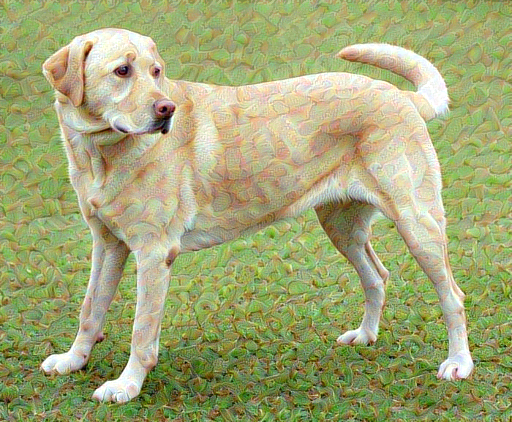

In [ ]:
result_image

Поскольку это работает, выполните более длительную оптимизацию:

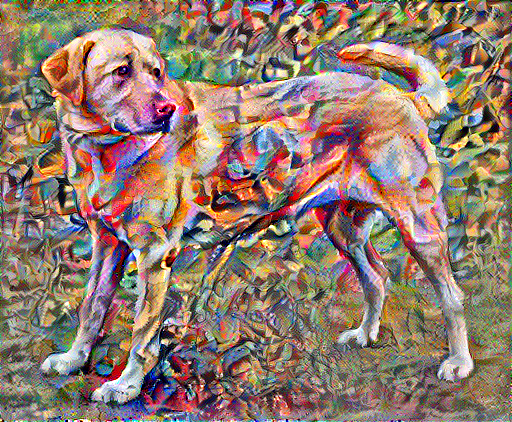

Train step: 1000
Total time: 84.0


In [ ]:
import time

# Начинаем отсчет времени для оптимизации
start = time.time()

# Устанавливаем количество эпох и шагов на эпоху
epochs = 10
steps_per_epoch = 100

step = 0
# Основной цикл для обучения
for n in range(epochs):
    for m in range(steps_per_epoch):
        step += 1
        train_step(image)  # Выполняем шаг оптимизации
        print(".", end='', flush=True)  # Выводим точку для каждого шага

    # Очищаем вывод и отображаем текущее состояние изображения
    display.clear_output(wait=True)
    display.display(tensor_to_image(image))
    print("Train step: {}".format(step))  # Выводим номер текущего шага

# Завершаем отсчет времени
end = time.time()
print("Total time: {:.1f}".format(end - start))  # Выводим общее время выполнения


## Потеря общей вариации

Одним из недостатков этой базовой реализации является то, что она создает много артефактов высокой частоты. Уменьшите их, добавив явный регуляризационный член для высокочастотных компонентов изображения. В переносе стиля это часто называется **потерей общей вариации**:

Кроме того, этот высокочастотный компонент по сути является детектором краев. Вы можете получить результат с помощью оператора Собеля

**tf.image.sobel_edges** — это функция в TensorFlow, которая возвращает тензор с картами рёбер Собеля для каждого канала.

Возвращаемый тензор содержит компоненты градиента изображения вдоль горизонтальной оси и вертикальной оси, в случае одноканального изображения.

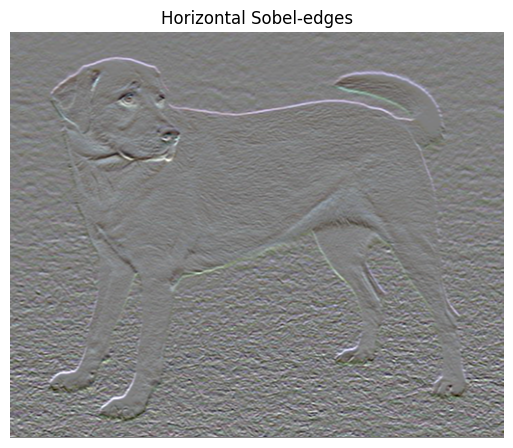

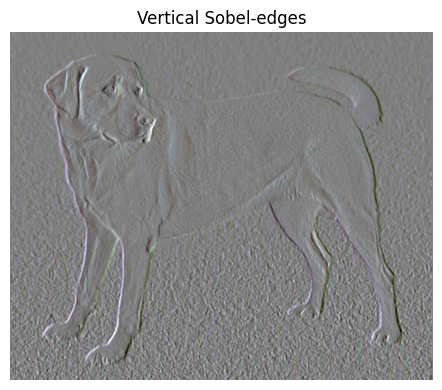

<Figure size 1200x1200 with 0 Axes>

In [ ]:
# Создаем фигуру для отображения результатов детектора краев Собеля
plt.figure(figsize=(14, 10))

# Применяем оператор Собеля к оригинальному изображению
sobel = tf.image.sobel_edges(content_image)

# Отображаем горизонтальные края, полученные с помощью оператора Собеля
plt.subplot(1, 2, 1)
imshow(clip_0_1(sobel[..., 0] / 4 + 0.5), "Horizontal Sobel-edges")

# Отображаем вертикальные края, полученные с помощью оператора Собеля
plt.subplot(1, 2, 2)
imshow(clip_0_1(sobel[..., 1] / 4 + 0.5), "Vertical Sobel-edges")

# Показываем результаты
plt.tight_layout()
plt.show()

# Это показывает, как высокочастотные компоненты увеличились.

Регуляризационная потеря, связанная с этим, представляет собой сумму квадратов значений

Это продемонстрировало, что она делает. Но нет необходимости реализовывать ее самостоятельно, так как TensorFlow включает стандартную реализацию:

In [ ]:
# Вычисляем потерю общей вариации с использованием стандартной реализации TensorFlow
tv_loss_tf = tf.image.total_variation(image).numpy()
print("Total Variation Loss (TensorFlow):", tv_loss_tf)


Total Variation Loss (TensorFlow): [149361.62]


## Перезапустите оптимизацию.

Выберите вес для `total_variation_loss`:

In [ ]:
# Устанавливаем вес для потерь общей вариации
total_variation_weight = 30


Теперь включите его в функцию `train_step`:

In [ ]:
@tf.function()
def train_step(image):
    """Выполняет один шаг оптимизации для обновления изображения."""
    with tf.GradientTape() as tape:
        # Извлекаем стили и контент из изображения
        outputs = extractor(image)

        # Вычисляем потери стиля и контента
        loss = style_content_loss(outputs)

        # Добавляем потери общей вариации
        loss += total_variation_weight * tf.image.total_variation(image)

    # Вычисляем градиенты потерь относительно изображения
    grad = tape.gradient(loss, image)

    # Применяем градиенты для обновления изображения
    opt.apply_gradients([(grad, image)])

    # Ограничиваем значения пикселей в диапазоне [0, 1]
    image.assign(clip_0_1(image))


Переинициализируйте переменную изображения и оптимизатор:

In [ ]:
# Переинициализируем оптимизатор
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Переинициализируем переменную изображения с содержимым
image = tf.Variable(content_image)


И запустите оптимизацию:


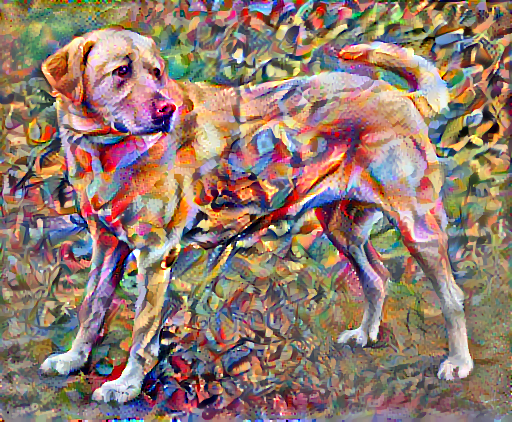

Train step: 1000
Total time: 84.6


In [ ]:
import time

# Запускаем процесс оптимизации с заданными параметрами
start = time.time()

epochs = 10  # Количество эпох
steps_per_epoch = 100  # Шаги на эпоху

step = 0
for n in range(epochs):
    for m in range(steps_per_epoch):
        step += 1
        train_step(image)  # Выполняем шаг оптимизации
        print(".", end='', flush=True)  # Печатаем точку для отслеживания прогресса
    display.clear_output(wait=True)  # Очищаем вывод
    display.display(tensor_to_image(image))  # Отображаем текущее изображение
    print("Train step: {}".format(step))  # Печатаем номер текущего шага

end = time.time()  # Завершаем замер времени
print("Total time: {:.1f}".format(end-start))  # Печатаем общее время выполнения


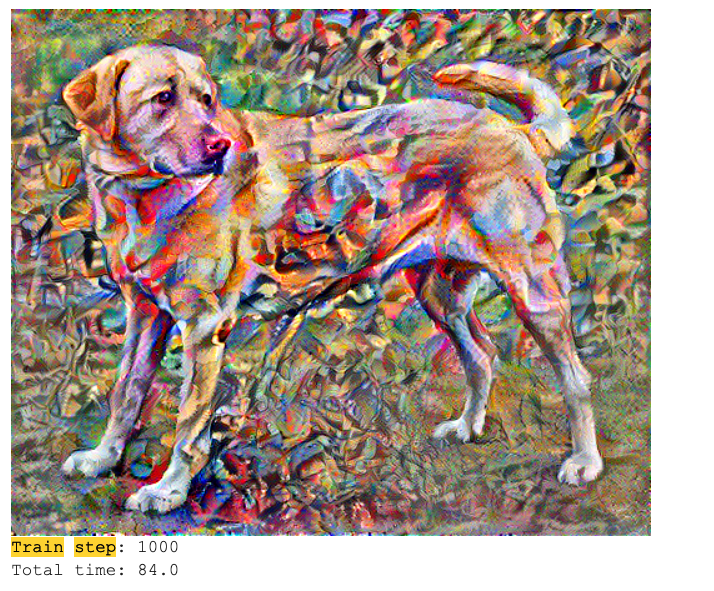